In [1]:
%matplotlib inline

In [2]:
import matplotlib.pyplot as plt
import random
import string
from eno_class import *
from learner_class import *

In [3]:
np.random.seed(230228)

In [4]:
# Hyper Parameters
LOCATION = 'tokyo'
YEAR = 2010

BATCH_SIZE = 24
LR = 0.01                   # learning rate
EPSILON = 0.7               # greedy policy
GAMMA = 0.9                 # reward discount
LAMBDA = 0.9                # parameter decay
TARGET_REPLACE_ITER = 24*7*4*2    # target update frequency (every two months)
MEMORY_CAPACITY = 24*7*4*6      # store upto six month worth of memory   

N_ACTIONS = 10 #no. of duty cycles (0,1,2,3,4)
N_STATES = 4 #number of state space parameter [batt, enp, henergy, fcast]
HIDDEN_LAYER = 20


End of Year
Average reward = -263.509877413553
Better reward ->  -263.509877413553
Saving model

End of Year
Average reward = -69.60378216816225
Better reward ->  -69.60378216816225
Saving model

End of Year
Average reward = 123.25991503865673
Better reward ->  123.25991503865673
Saving model

End of Year
Average reward = 143.1907155032434
Better reward ->  143.1907155032434
Saving model

End of Year
Average reward = 215.76314156671776
Better reward ->  215.76314156671776
Saving model

End of Year
Average reward = 154.67996889591262

End of Year
Average reward = 167.91719577714662

End of Year
Average reward = 129.8807125845342

End of Year
Average reward = 189.1268210126631

End of Year
Average reward = 152.2161158238278


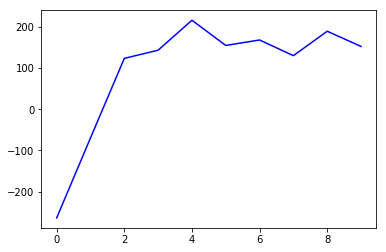

In [7]:
dqn = DQN() #refer to learner_class.py class file
capm = CAPM(LOCATION,YEAR,shuffle=True) #refer to eno_class.py class file
NO_OF_ITERATIONS = 10
best_avg_reward = -1000 #initialize best average reward to very low value
PFILENAME = ''.join(random.choice(string.ascii_uppercase + string.digits) for _ in range(8)) #create random filename
PFILENAME = PFILENAME + ".pt" #this file stores the best model

avg_reward_rec = np.empty(1)

for iteration in range(NO_OF_ITERATIONS):

    print('\nCollecting experience... Iteration:', iteration)
#     print("EPSILON = ", EPSILON)
#     print("LR = ", LR)
#     print("LAMBDA = ", LAMBDA)

    s, r, day_end, year_end = capm.reset()
    record = np.empty(4)

    transition_rec = np.zeros((capm.eno.TIME_STEPS, N_STATES * 2 + 2)) #record all the transition in one day

    while True:
        a = dqn.choose_action(s)
        #state = [batt, enp, henergy, fcast]
        record = np.vstack((record, [s[0],s[2],r, a])) #record battery, henergy, reward and action

        # take action
        s_, r, day_end, year_end = capm.step(a)

        temp_transitions = np.hstack((s, [a, r], s_))
        transition_rec[capm.eno.hr-1,:] = temp_transitions

        if (day_end):
            transition_rec[:,5] = r #broadcast reward to all states
            decay_factor = [i for i in (LAMBDA**n for n in reversed(range(0, capm.eno.TIME_STEPS)))]
            transition_rec[:,5] = transition_rec[:,5] * decay_factor #decay reward proportionately
            dqn.store_day_transition(transition_rec)

        if dqn.memory_counter > MEMORY_CAPACITY:
            dqn.learn()

        if (year_end):
            print("End of Year")
            break

        s = s_

    record = np.delete(record, 0, 0) #remove the first row which is garbage

    reward_rec = record[:,2]
    reward_rec = reward_rec[reward_rec != 0]
    print("Average reward =", np.mean(reward_rec) )
    avg_reward_rec = np.append(avg_reward_rec, np.mean(reward_rec))

    if(best_avg_reward < np.mean(reward_rec)):
        best_avg_reward = np.mean(reward_rec)
        print("Better reward -> ", best_avg_reward)
        print("Saving model")
        torch.save(dqn.eval_net.state_dict(), PFILENAME)

avg_reward_rec = np.delete(avg_reward_rec, 0, 0) #remove the first row which is garbage
plt.plot(avg_reward_rec,'b')

In [8]:
dqn = DQN()
capm = CAPM(LOCATION,YEAR, shuffle=False)
print('\nYear run test')
print('Model Used: ',PFILENAME)

#load the best model
dqn.eval_net.load_state_dict(torch.load(PFILENAME))
dqn.eval_net.eval()
s, r, day_end, year_end = capm.reset()
yr_test_record = np.empty(4)

while True:
    a = dqn.choose_greedy_action(s)

    #state = [batt, enp, henergy, fcast]
    yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action

    # take action
    s_, r, day_end, year_end = capm.step(a)

    if year_end:
        print("End of Year")
        break
       
    s = s_

yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage




Year run test
Model Used:  G7N8ZLIX.pt
End of Year


Average Reward =  213.14711429568595


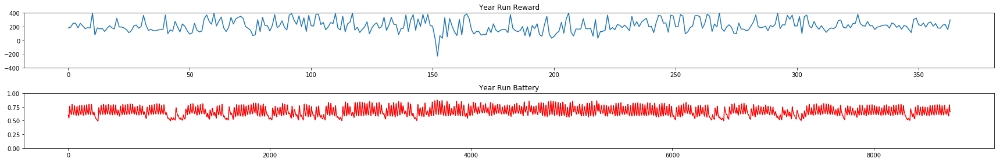

In [9]:
yr_test_reward_rec = yr_test_record[:,2]
yr_test_reward_rec = yr_test_reward_rec[yr_test_reward_rec != 0]
print('Average Reward = ', np.mean(yr_test_reward_rec))


fig = plt.figure(figsize=(24,4))
ax1 = fig.add_subplot(211)
ax1.plot(yr_test_reward_rec)
ax1.set_title("Year Run Reward")
ax1.set_ylim([-400,400])

ax2 = fig.add_subplot(212)
ax2.plot(yr_test_record[:,0],'r')
ax2.set_title("Year Run Battery")
ax2.set_ylim([0,1])

fig.tight_layout()

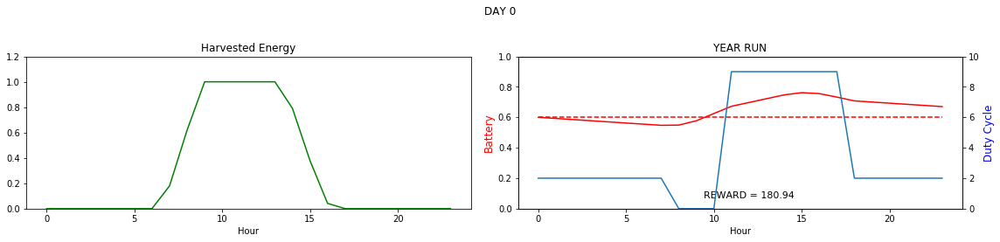

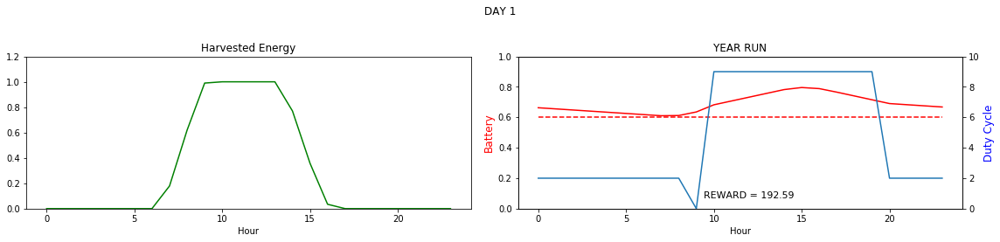

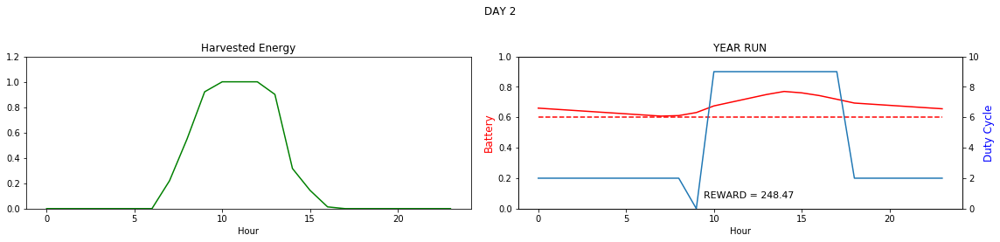

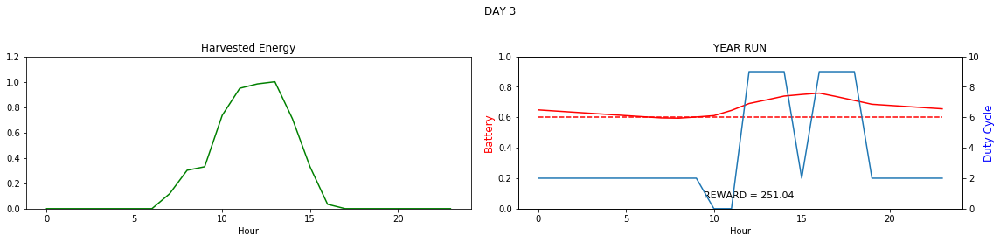

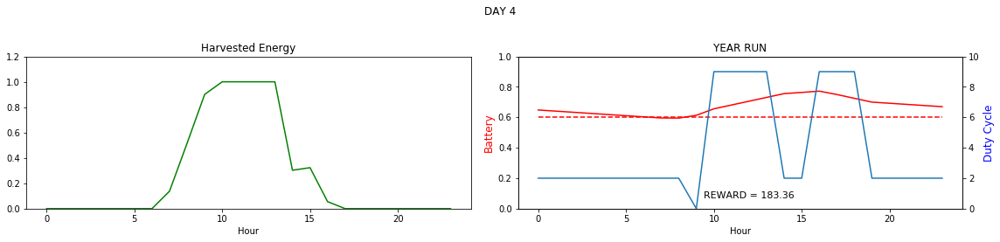

...

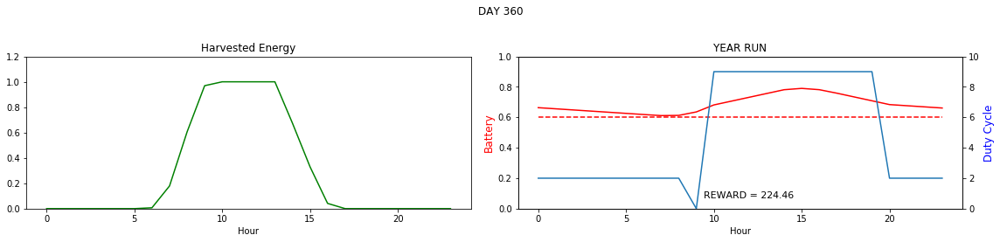

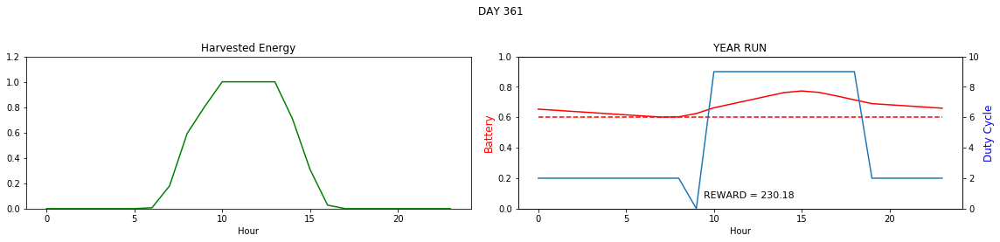

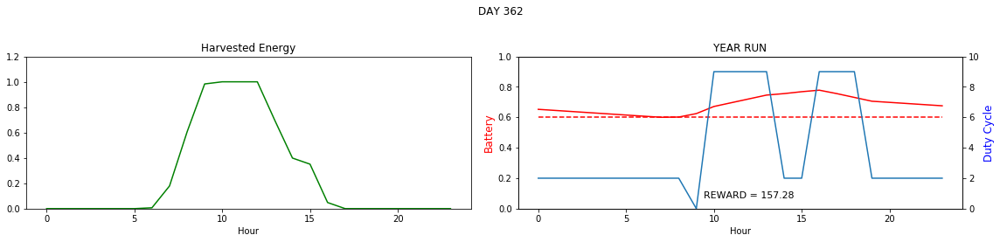

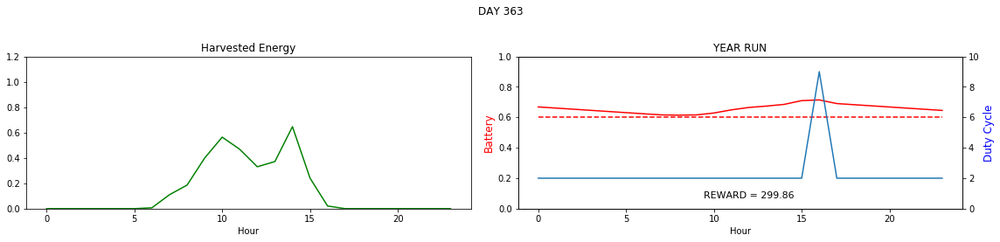

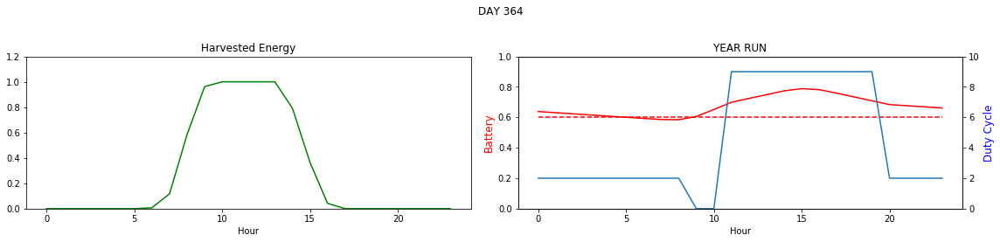

In [10]:
TIME_AXIS = np.arange(0,capm.eno.TIME_STEPS)
for DAY in range(capm.eno.NO_OF_DAYS):
    START = DAY*24
    END = START+24

    fig = plt.figure(figsize=(16,4))
    st = fig.suptitle("DAY %s" %(DAY))

    ax2 = fig.add_subplot(121)
    ax2.plot(yr_test_record[START:END,1],'g')
    ax2.set_title("Harvested Energy")
    plt.xlabel("Hour")
    ax2.set_ylim([0,1.2])

    #plot battery for year run
    ax1 = fig.add_subplot(122)
    ax1.plot(TIME_AXIS,yr_test_record[START:END,0],'r') 
    ax1.plot(TIME_AXIS, np.ones(capm.eno.TIME_STEPS)*capm.BOPT/capm.BMAX,'r--')
    ax1.set_title("YEAR RUN")
    if END < (capm.eno.NO_OF_DAYS*capm.eno.TIME_STEPS):
        ax1.text(12, 0, "REWARD = %.2f\n" %(yr_test_record[END,2]),fontsize=11, ha='center')
    plt.xlabel("Hour")
    ax1.set_ylabel('Battery', color='r',fontsize=12)
    ax1.set_ylim([0,1])

    #plot actions for year run
    ax1a = ax1.twinx()
    ax1a.plot(yr_test_record[START:END,3])
    ax1a.set_ylim([0,N_ACTIONS])
    ax1a.set_ylabel('Duty Cycle', color='b',fontsize=12)
    
    fig.tight_layout()
    st.set_y(0.95)
    fig.subplots_adjust(top=0.75)
    plt.show()
